# Assignment - A04 Feature & Target Engineering (10 ⭕️s)

**Jonah Ebent**


## **Overview**

*Dataset:* A04_rental_satisfaction_raw.csv

**Overview:** This example notebook will walk you through the example covered in class.

Go over it to review and practice:
- choosing a target
- choosing possible features
- engineering features
- identifying sub-populations

In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

df = pd.read_csv("A04_rental_satisfaction_raw.csv")
df.head()

,Travel_type,Price_per_night,Distance_to_center,Review_count,Room_size,Host_response_time,Has_fast_wifi,Has_dedicated_workspace,Has_parking,Has_gym,Has_breakfast,Has_kitchen,Has_pool,Has_laundry,Amenities_comfort_extra,Amenities_luxury_extra,Satisfaction,Would_recommend
0,Pleasure,173.765408,7.709603,38,91.591683,203.548350,1,1,1,1,1,1,1,1,1,7,7.980143,1
1,Pleasure,100.780025,18.627950,265,54.340931,218.329190,1,1,1,1,1,1,1,1,1,3,7.204375,0
2,Pleasure,467.290274,0.889724,329,115.573040,48.274574,1,1,1,1,1,1,1,1,4,5,5.336511,0
3,Pleasure,489.348487,17.812584,392,27.117357,219.407734,0,1,1,0,1,1,1,1,0,0,1.000000,0
4,Pleasure,300.430979,13.969196,389,81.428281,15.676725,1,1,1,1,1,1,0,1,0,0,8.432359,1


In [24]:
# First look at data

print("Rows, Columns:", df.shape)
print("\nColumns:")
for c in df.columns:
    print(" -", c)

print("\nBasic summary:")
display(df.describe(include="all"))

Rows, Columns: (8000, 18)

Columns:
 - Travel_type
 - Price_per_night
 - Distance_to_center
 - Review_count
 - Room_size
 - Host_response_time
 - Has_fast_wifi
 - Has_dedicated_workspace
 - Has_parking
 - Has_gym
 - Has_breakfast
 - Has_kitchen
 - Has_pool
 - Has_laundry
 - Amenities_comfort_extra
 - Amenities_luxury_extra
 - Satisfaction
 - Would_recommend

Basic summary:


,Travel_type,Price_per_night,Distance_to_center,Review_count,Room_size,Host_response_time,Has_fast_wifi,Has_dedicated_workspace,Has_parking,Has_gym,Has_breakfast,Has_kitchen,Has_pool,Has_laundry,Amenities_comfort_extra,Amenities_luxury_extra,Satisfaction,Would_recommend
count,8000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.00000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000
unique,2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,Business,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,4032,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,277.384643,10.035135,249.869125,67.709714,122.570442,0.956625,0.905875,0.929625,0.90725,0.866625,0.900750,0.811000,0.935875,1.659000,1.100625,4.960019,0.397500
std,NaN,126.195458,5.786346,145.516004,30.212690,68.060851,0.203713,0.292021,0.255794,0.29010,0.340001,0.299016,0.391533,0.244991,1.979889,1.502342,2.766808,0.489412
min,NaN,60.066859,0.002594,0.000000,15.000636,5.066929,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000
25%,NaN,167.711820,5.050887,123.000000,41.467448,63.561347,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,2.294786,0.000000
50%,NaN,276.802179,10.131020,249.500000,67.791229,123.408597,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,5.240280,0.000000
75%,NaN,386.164909,15.043526,375.000000,93.970633,181.638819,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,3.000000,2.000000,7.258125,1.000000


## Target Selection

**Task:** Predict quality of stay at Airbnb

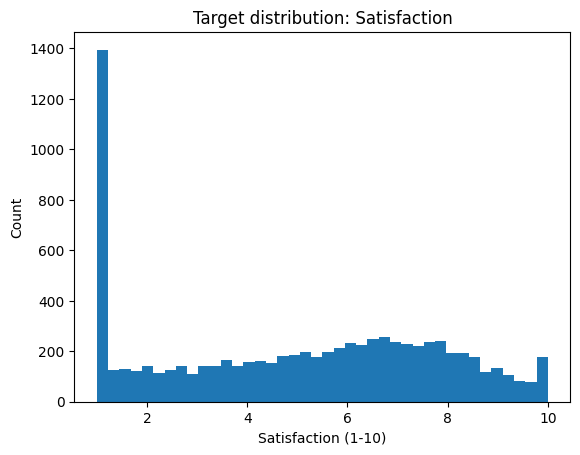

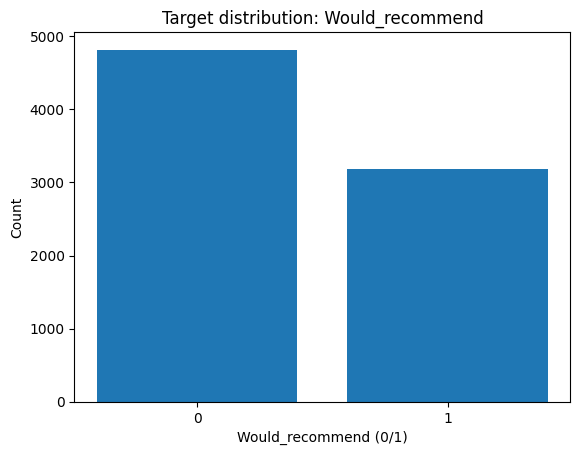

Would_recommend rate: 0.3975


In [25]:
# Possible targets are
#   - Satisfaction
#   - Would_recommend

plt.figure()
plt.hist(df["Satisfaction"], bins=40)
plt.xlabel("Satisfaction (1-10)")
plt.ylabel("Count")
plt.title("Target distribution: Satisfaction")
plt.show()

plt.figure()
counts = df["Would_recommend"].value_counts().sort_index()
plt.bar(counts.index.astype(str), counts.values)
plt.xlabel("Would_recommend (0/1)")
plt.ylabel("Count")
plt.title("Target distribution: Would_recommend")
plt.show()

print("Would_recommend rate:", df["Would_recommend"].mean())

## Q1

⭕️ Which variable would be a good regression target?

⭕️ Which one would be a good classification target?

`Satisfaction` would be a good regression target.

`Would_recommend` would be a good classification target.

## Possible Features

In [26]:
# Possible features
# Starting with obvious numeric columns.

basic_features = [
    "Price_per_night",
    "Distance_to_center",
    "Review_count",
    "Room_size",
    "Host_response_time"
]

df[basic_features].describe()

,Price_per_night,Distance_to_center,Review_count,Room_size,Host_response_time
count,8000.000000,8000.000000,8000.000000,8000.000000,8000.000000
mean,277.384643,10.035135,249.869125,67.709714,122.570442
std,126.195458,5.786346,145.516004,30.212690,68.060851
min,60.066859,0.002594,0.000000,15.000636,5.066929
25%,167.711820,5.050887,123.000000,41.467448,63.561347
50%,276.802179,10.131020,249.500000,67.791229,123.408597
75%,386.164909,15.043526,375.000000,93.970633,181.638819
max,499.995132,19.997555,500.000000,119.938365,239.945675


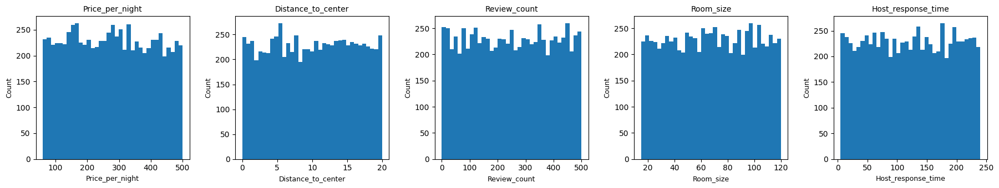

In [27]:
fig, axes = plt.subplots(1, 5, figsize=(18, 3.5))

for ax, col in zip(axes, basic_features):
    ax.hist(df[col], bins=35)
    ax.set_title(col, fontsize=10)
    ax.set_xlabel(col, fontsize=9)
    ax.set_ylabel("Count", fontsize=9)

plt.tight_layout()
plt.show()

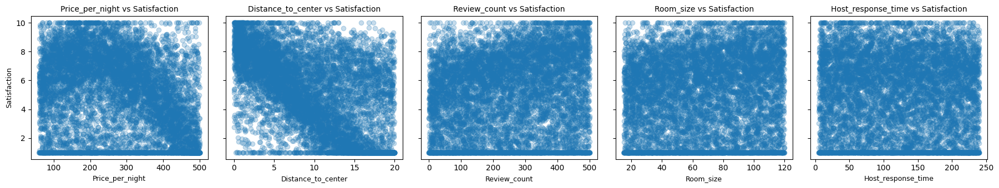

In [28]:
# Is any of these related to the target?

fig, axes = plt.subplots(1, 5, figsize=(18, 3.5), sharey=True)

for ax, col in zip(axes, basic_features):
    ax.scatter(df[col], df["Satisfaction"], alpha=0.25)
    ax.set_title(f"{col} vs Satisfaction", fontsize=10)
    ax.set_xlabel(col, fontsize=9)

axes[0].set_ylabel("Satisfaction", fontsize=9)

plt.tight_layout()
plt.show()


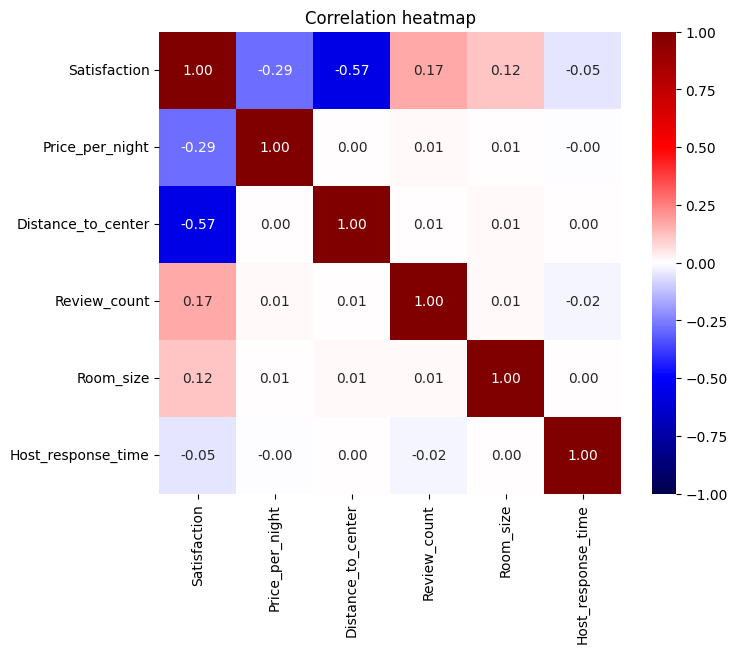

In [29]:
# Make a heat map

basic_features = [
    "Price_per_night",
    "Distance_to_center",
    "Review_count",
    "Room_size",
    "Host_response_time"
]
pair_cols = ["Satisfaction"] + basic_features


def corr_heatmap(df_in, cols, title):
    corr = df_in[cols].corr(numeric_only=True)
    plt.figure(figsize=(8, 6))
    sns.heatmap(corr, annot=True, fmt=".2f",
                square=True, cmap="seismic", vmin=-1.0, vmax=1.0)
    plt.title(title)
    plt.show()

corr_heatmap(df, pair_cols, "Correlation heatmap")



Number of numeric columns: 17
Columns included:
 - Price_per_night
 - Distance_to_center
 - Review_count
 - Room_size
 - Host_response_time
 - Has_fast_wifi
 - Has_dedicated_workspace
 - Has_parking
 - Has_gym
 - Has_breakfast
 - Has_kitchen
 - Has_pool
 - Has_laundry
 - Amenities_comfort_extra
 - Amenities_luxury_extra
 - Satisfaction
 - Would_recommend


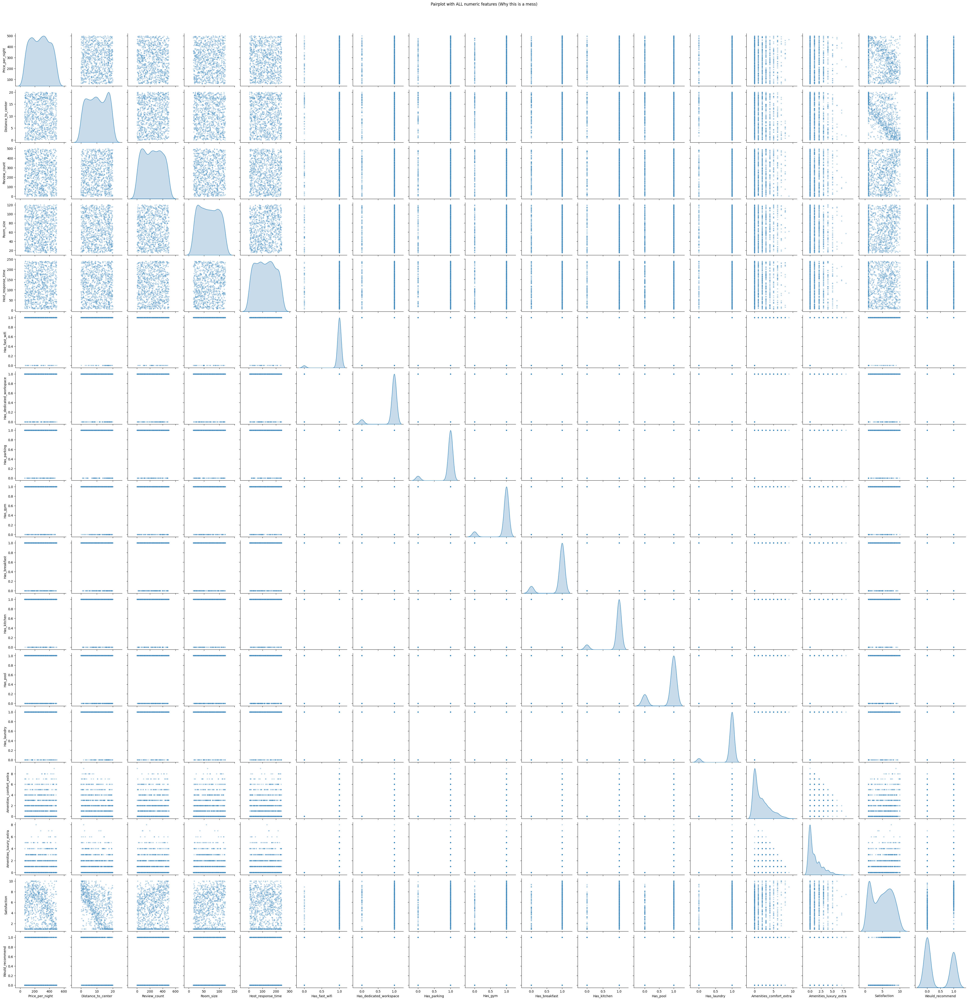

In [30]:
# Pairplot shows relationships between ALL pairs of variables.

# It will look like a mess, but for some datasets, it is useful out of the box.

# Select all numeric columns automatically
all_numeric = df.select_dtypes(include=["int64", "float64"]).columns.tolist()

print("Number of numeric columns:", len(all_numeric))
print("Columns included:")
for c in all_numeric:
    print(" -", c)

# Do it for a sample so t < age of universe
sample = df[all_numeric].sample(n=min(1000, len(df)), random_state=340)

sns.pairplot(sample, diag_kind="kde", plot_kws={"alpha": 0.3, "s": 15})
plt.suptitle("Pairplot with ALL numeric features (Why this is a mess)", y=1.02)
plt.show()

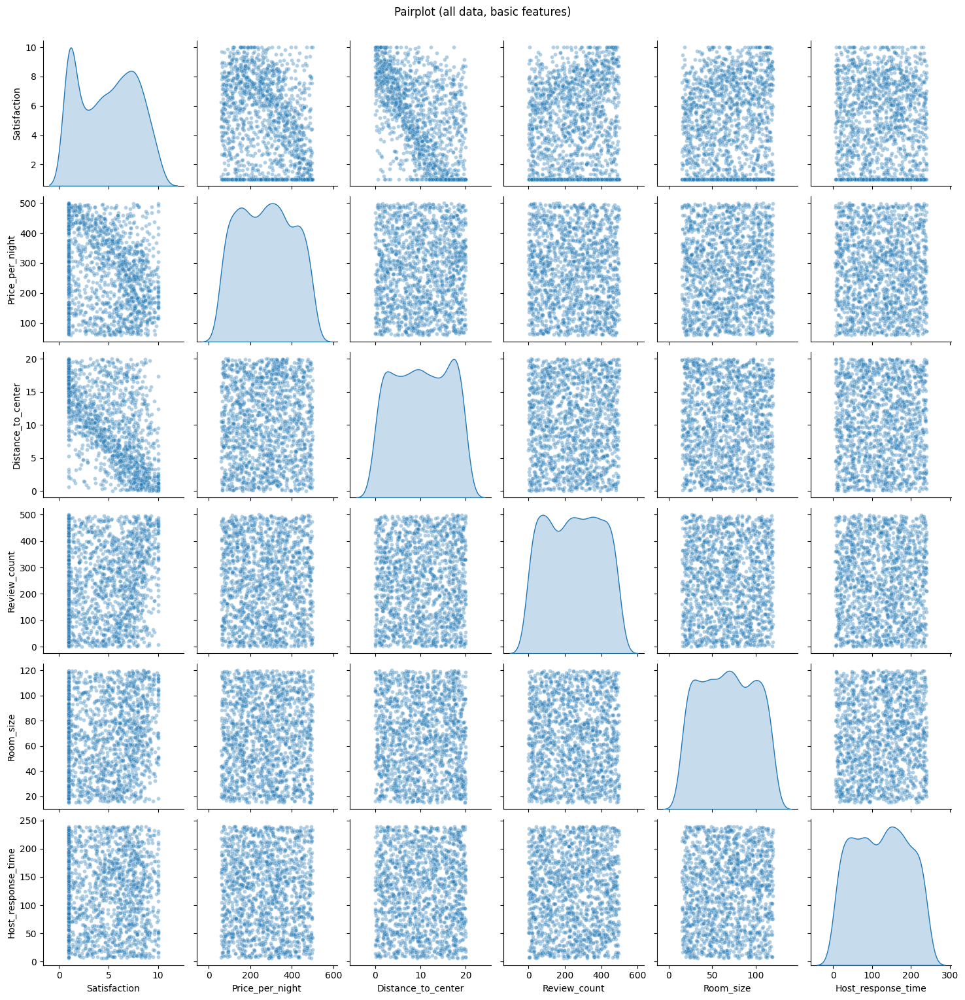

In [31]:
# You can make these pair plots for
# every NUMERICAL column in the dataset...

pair_cols = ["Satisfaction"] + ["Travel_type"] + basic_features
sample = df[pair_cols].sample(n=min(1500, len(df)), random_state=340)

sns.pairplot(sample, diag_kind="kde", plot_kws={"alpha": 0.35, "s": 18})
plt.suptitle("Pairplot (all data, basic features)", y=1.02)
plt.show()

## Task 1

⭕️ Make a pair plot that is colored by sub-population to see correlations more clearly.

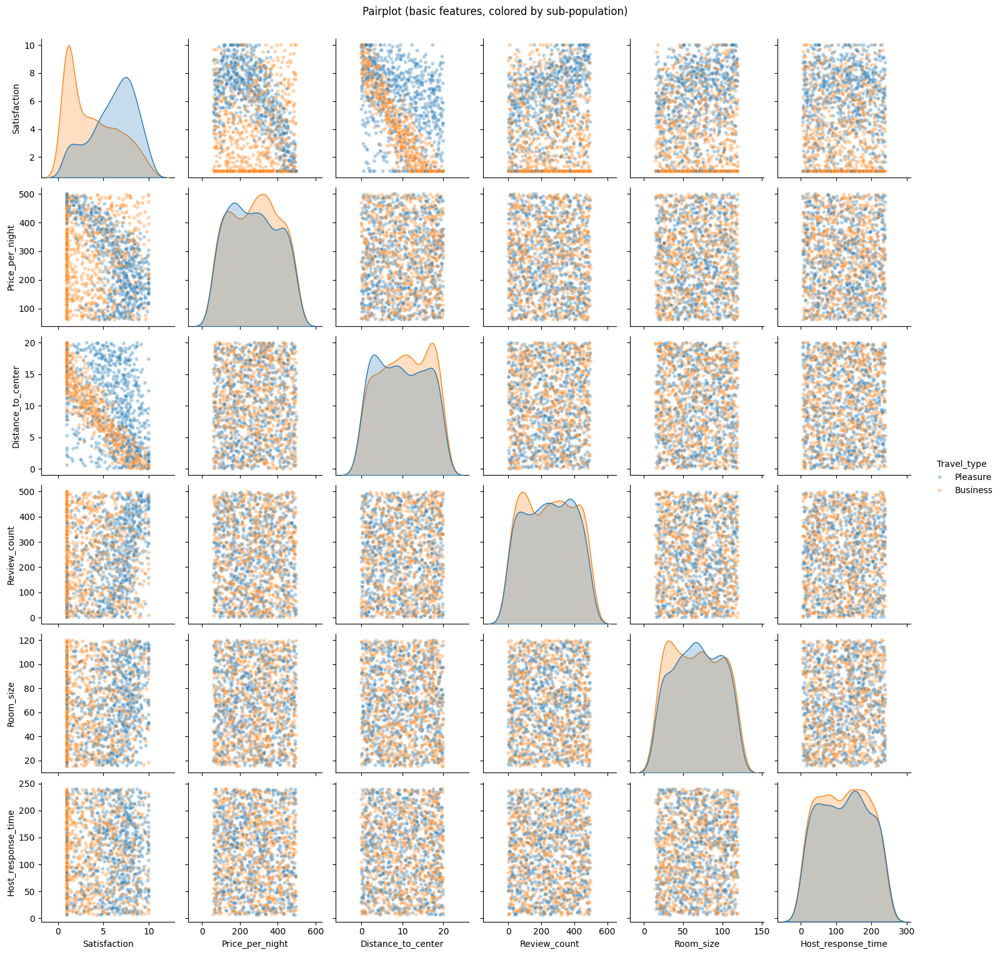

In [32]:


sample = df[pair_cols].sample(n=min(1500, len(df)), random_state=340)

sns.pairplot(
    sample,
    hue="Travel_type", # your sub-population column as "column-name",
    diag_kind="kde",
    plot_kws={"alpha": 0.35, "s": 18}
)
plt.suptitle("Pairplot (basic features, colored by sub-population)", y=1.02)
plt.show()


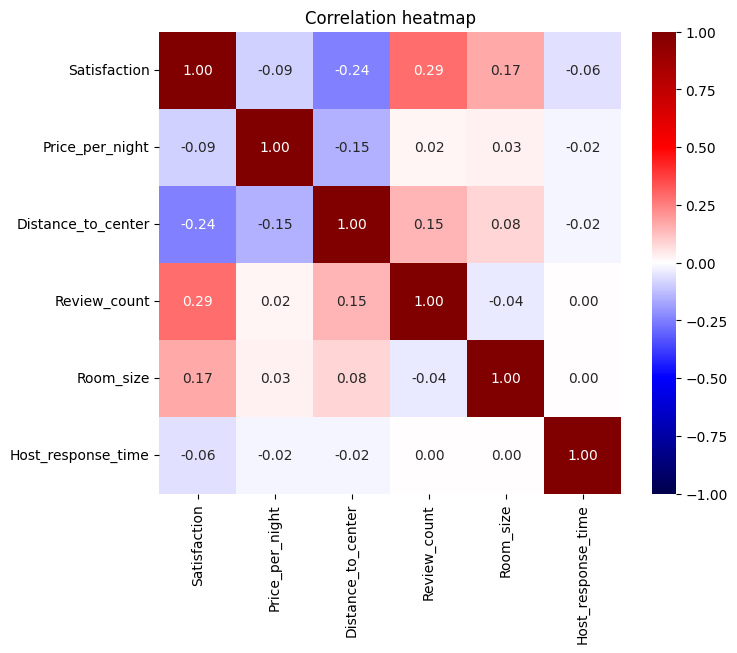

In [33]:
# We can also quantify the correlations per population with a map as before
# You can make correlation heat maps for a specific population by adding a condition
# For example, this prints a heatmap for high satisfaction entries

corr_heatmap(df[df["Satisfaction"] > 6], pair_cols, "Correlation heatmap")


## Task 2

⭕️ Make correlation heat maps for each of your sub-populations

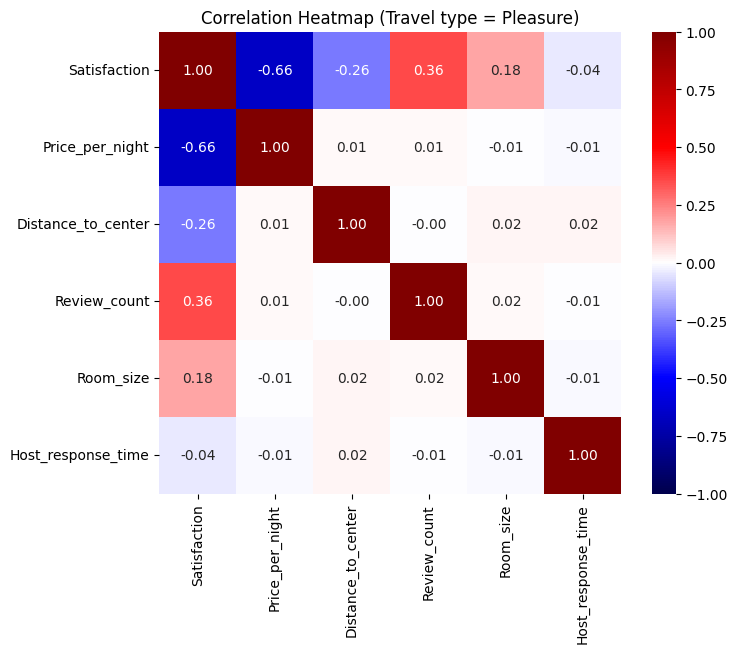

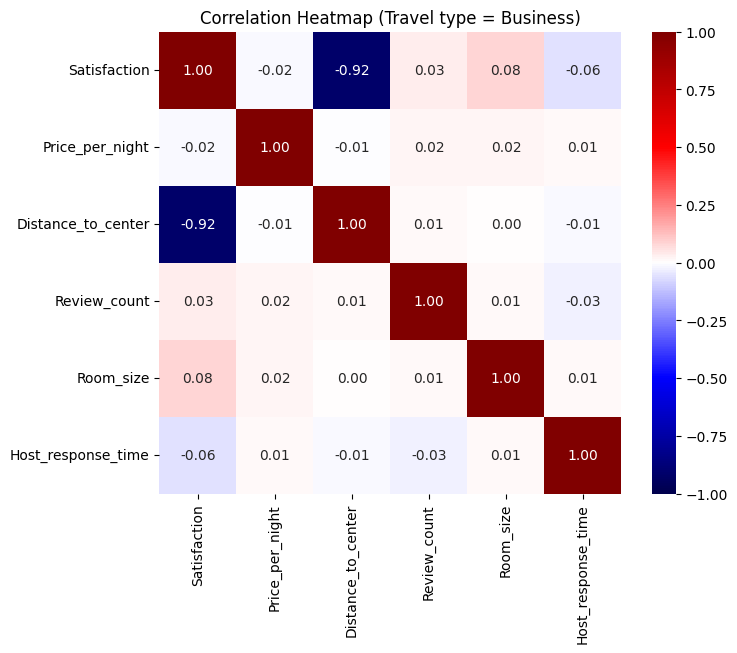

In [34]:
corr_heatmap(df[df["Travel_type"]=="Pleasure"], pair_cols, "Correlation Heatmap (Travel type = Pleasure)")
corr_heatmap(df[df["Travel_type"]=="Business"], pair_cols, "Correlation Heatmap (Travel type = Business)")

## Engineered features

As per our discussion in class, let's engineer a feature for all the amenities

In [35]:
# Find all amenity columns.

amenity_flags = [c for c in df.columns if c.startswith("Has_")]
amenity_extras = ["Amenities_comfort_extra", "Amenities_luxury_extra"]

print("Binary amenity columns:", amenity_flags)
print("Other amenity columns:", amenity_extras)

Binary amenity columns: ['Has_fast_wifi', 'Has_dedicated_workspace', 'Has_parking', 'Has_gym', 'Has_breakfast', 'Has_kitchen', 'Has_pool', 'Has_laundry']
Other amenity columns: ['Amenities_comfort_extra', 'Amenities_luxury_extra']


In [36]:
# Engineer Amenities_count

df["Amenities_count"] = (
    df[amenity_flags].sum(axis=1)
    + df["Amenities_comfort_extra"]
    + df["Amenities_luxury_extra"]
).astype(int)

df[["Amenities_count"] + amenity_extras].head()

,Amenities_count,Amenities_comfort_extra,Amenities_luxury_extra
0,16,1,7
1,12,1,3
2,17,4,5
3,6,0,0
4,7,0,0


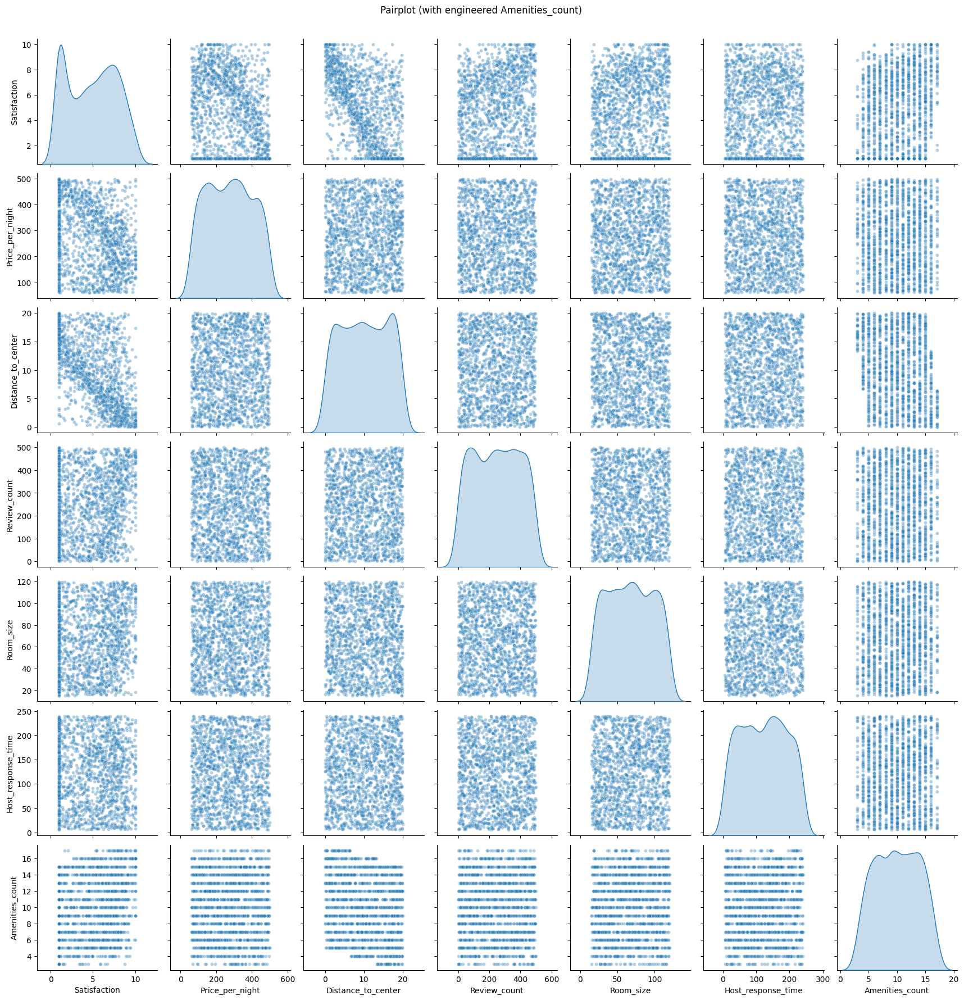

In [37]:
# Update pairplots and correlation matrices with engineered feature

pair_cols2 = pair_cols + ["Amenities_count"]

sample = df[pair_cols2].sample(n=min(1500, len(df)), random_state=340)
sns.pairplot(sample, diag_kind="kde", plot_kws={"alpha": 0.35, "s": 18})
plt.suptitle("Pairplot (with engineered Amenities_count)", y=1.02)
plt.show()


## Task 3

⭕️ Add a pair plot colored by sub-population and including the engineered feature

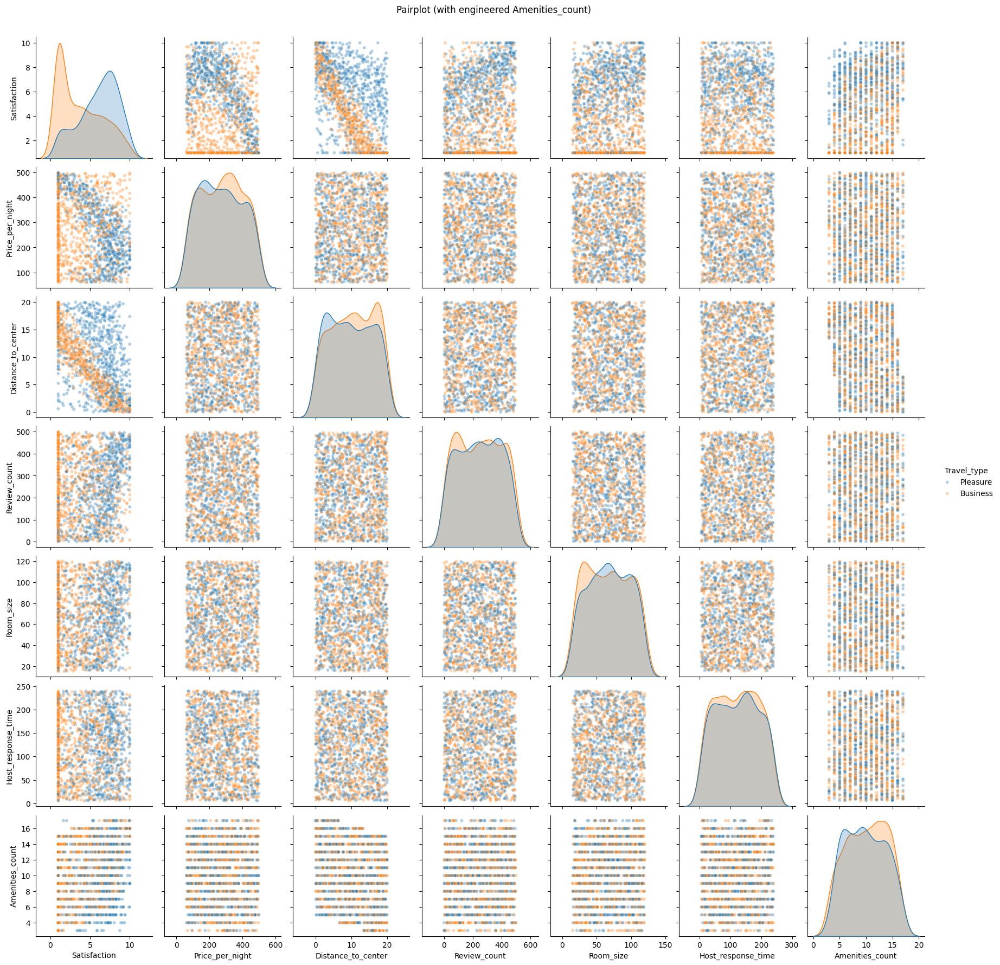

In [38]:
sns.pairplot(sample, hue="Travel_type", diag_kind="kde", plot_kws={"alpha": 0.35, "s": 18})
plt.suptitle("Pairplot (with engineered Amenities_count)", y=1.02)
plt.show()

## Task 4

Create heatmaps that include the engineered feature for:
- All types of data
- Each of your sub-populations

⭕️⭕️

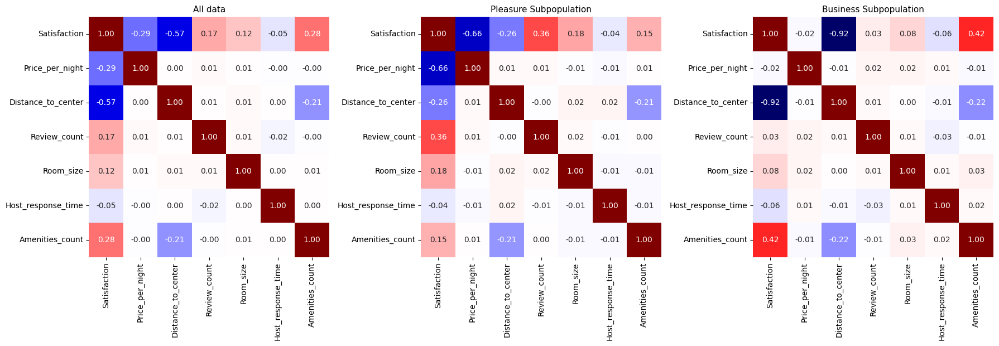

In [39]:

def corr_heatmap_on_ax(ax, df_in, cols, title):
    corr = df_in[cols].corr(numeric_only=True)
    sns.heatmap(corr, annot=True, fmt=".2f", square=True, ax=ax, cbar=False, vmin=-1.0, cmap="seismic")
    ax.set_title(title, fontsize=11)

# assumes you already created Amenities_count and defined:
# pair_cols2 = pair_cols + ["Amenities_count"]
# (from earlier in the notebook)

fig, axes = plt.subplots(1, 3, figsize=(18, 7))
# axes[N] draws the plot in the Nth sub-panel of the figure (starts at 0)
corr_heatmap_on_ax(axes[0], df, pair_cols2, "All data")
# Add the right conditions to the following heatmaps
corr_heatmap_on_ax(axes[1], df[df["Travel_type"] == "Pleasure"], pair_cols2, "Pleasure Subpopulation")
corr_heatmap_on_ax(axes[2], df[df["Travel_type"] == "Business"], pair_cols2, "Business Subpopulation")


plt.tight_layout()
plt.show()

## Q3

⭕️ Which subpopulations did you identify and why?

⭕️ Which features would you use to train a model that predicts satisfaction for each population?

I identified the "Pleasure" and "Business" subpopulations in the "Travel_type"
field. Having analyzed the correlation heatmaps, I concluded that these
subpopulations have very different satisfaction criteria. People traveling for
pleasure and those traveling for business have different priorities in mind when
selecting a place to stay.

I would use the following features:
- Travel_type
- Distance_to_center
- Price_per_night
- Amenities_count
- Review_count
- Room_size